## **Part I: Data Preparation and Import**

In [ ]:
# set up environment and library
import os
import sys
import math
import collections
import numpy as np
import cv2
import pandas as pd
from scipy.spatial.distance import cdist\

# Data read & write
# import h5py
# Visualization
# import open3d as o3d
# import pptk 
# works with Python 3.6

#!apt-get install vtk6
#!apt-get install python-vtk
#!pip install mayavi

#!pip install pyvista
#import pyvista as pv

from scipy.linalg import lstsq
# from PyQt5 import QtWidgets
# from mayavi import mlab
from mpl_toolkits.mplot3d import Axes3D
from scipy.optimize import least_squares

# %matplotlib inline
# %matplotlib notebook
import matplotlib
import matplotlib.pyplot as plt
matplotlib.get_backend()

import plotly.express as px

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
cd /content/drive/MyDrive/3DreconstructionAR/ChairImages


/content/drive/MyDrive/3DreconstructionAR/ChairImages


In [ ]:
# create the name array of images to be loaded
ImageNames = ['custom1.jpg', 'custom2.jpg', 'custom3.jpg', 'custom4.jpg', 'custom5.jpg', 'custom6.jpg', 'custom7.jpg', 'custom8.jpg', 'custom9.jpg', 'custom10.jpg', 'custom11.jpg', 'custom12.jpg', 'custom13.jpg']

In [ ]:
# create the name array of images to be loaded
ImageNames = ['chair1.jpg', 
        'chair2.jpg', 
        'chair3.jpg', 
        'chair4.jpg', 
        'chair5.jpg', 
        'chair6.jpg', 
        'chair7.jpg', 
        'chair8.jpg', 
        'chair9.jpg', 
        'chair10.jpg', 
        'chair11.jpg', 
        'chair12.jpg',
        'chair13.jpg',
        'chair14.jpg',
        'chair15.jpg',
        'chair16.jpg',
        'chair17.jpg']

## **Part II: Feature Extraction and Matching**

In [ ]:
def feature_color_extraction(ImageNames):
  # Input:
  # ImageNames: N x 1 array with file names of the images (N = number of images)

  # Output:
  # np.array(kp_all): N x 1 array of all the keypoints 
  # np.array(des_all): N x 1 array of all the descriptors
  # np.array(color_all): N x 1 nested array of all the colors where color_all[i] is a M x 3 array (M being the number of keypoints extracted in each image)

  # create two keypoint and descriptor arrays
  kp_all = []
  des_all = []
  sift = cv2.xfeatures2d.SIFT_create()
  # create a array for color of keypoints in the original colored image
  color_all = []
  # load the images, get the keypoints and descriptors
  for ImgName in ImageNames:
    Img = cv2.imread(ImgName)
    # skip empty images
    if Img is None:
      continue
    kp, des = sift.detectAndCompute(cv2.cvtColor(Img, cv2.COLOR_BGR2GRAY), None)
    kp_all.append(kp)
    des_all.append(des)
    # extract the colors
    colors = np.zeros((len(kp), 3))
    for i, key_point in enumerate(kp):
      # get the actual coordinate of the kp
      p = key_point.pt
      # get the color of each kp
      colors[i] = Img[int(p[1])][int(p[0])]         
    color_all.append(colors)

  return np.array(kp_all,dtype=object), np.array(des_all,dtype=object), np.array(color_all,dtype=object)

In [ ]:
# Brute-Force Matching with SIFT Descriptors and Ratio Test
def matching_and_testing(I1, kp1, des1, I2, kp2, des2):
  # Input:
  # I1, I2: two images
  # des1, des2: two sets of SIFT Descriptors
  # kp1, kp2: two sets of keypoints

  # Output: 
  # pairs: N x 4 matrix where col1 and col2 show the coordinate of points in image1 matching the points in image2 with coordinate in col3 and col4

  norm = cv2.NORM_L2
  bf = cv2.BFMatcher(norm)
  matches = bf.knnMatch(des1, des2, k = 2) # k for number of best matches

  # apply ratio test with ratio 0.8
  good_matches = []
  for m,n in matches:
    if m.distance < 0.8 * n.distance:
      good_matches.append([m])

  # plot the image with matching points
  Image = cv2.drawMatchesKnn(I1, kp1, I2, kp2, good_matches, None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  plt.imshow(Image)
  plt.show()

  # include the pairs of good points in a matrix
  pairs = np.empty((0,4))
  for pair in good_matches:
    tp1 = np.array([[kp1[pair[0].queryIdx].pt[0], kp1[pair[0].queryIdx].pt[1], kp2[pair[0].trainIdx].pt[0], kp2[pair[0].trainIdx].pt[1]]])
    pairs = np.append(pairs, tp1, axis = 0)
  return pairs

In [ ]:
# Compute homography transform matrix given 4 pairs of corresponding points
def compute_homography(p1, p2):	
  # Input:
  # p1, p2: 4 x 2 array of 4 corresponding points

  # Output:
  # H: (3,3) shape of homography matrix such that lambda * p1 = H @ p2

  A = np.empty((0,9))

  for i in range(0,4):
    line1 = np.array([[p2[i,0],p2[i,1],1,0,0,0,-(p2[i,0] * p1[i,0]),-(p2[i,1] * p1[i,0]),-p1[i,0]]])
    A = np.append(A, line1, axis=0)
    line2 = np.array([[0,0,0,p2[i,0],p2[i,1],1,-(p2[i,0] * p1[i,1]),-(p2[i,1] * p1[i,1]),-p1[i,1]]])
    A = np.append(A, line2, axis=0)

  # Use SVD to find the solution vector h such that Ah = 0 (Hint: you may find np.linalg.svd useful)
  u,s,vh = np.linalg.svd(A)
  v = vh.T
  h = v[:,-1]/v[-1,-1]

  # Reorgnize the solution vector and normalize it to get homography matrix
  H = h.reshape(3,3)
  return H

In [ ]:
# Ransac Correction
def ransac_homography(p1, p2, pairs):
  
  # Input:
  # p1, p2: N x 2 shape of correponding points

  # Output:
  # H: 3 x 3 shape of estimated homography matrix such that lambda * p1 = H @ p2
  # inliers: inliners of the estimation

  # probability of RANSAC success
  p = 1 - 10**-2
  w = 0.5
  n = 4
  k = np.ceil(np.log(1 - p) / np.log(1 - w**n)).astype(np.uint32)
  # Decide how many loops to run and what the threshold is
  inliners_max = 0
  for i in range (0,k):
  # RANSAC loop, inside in the loop
  #     1) Randomly pick n samples from p1 and p2 that is enough to fit a model (n=4 here)
        u1_index = np.random.choice(p1.shape[0], n, replace=False)
        u1 = np.empty((0,2))
        for j in u1_index:
          u1 = np.append(u1, np.array([[p1[j,0],p1[j,1]]]), axis=0)
        v1 = np.empty((0,2))
        for j in u1_index:
          v1 = np.append(v1, np.array([[p2[j,0],p2[j,1]]]), axis=0)
  #     2) Fit the model and get a estimation
        H = compute_homography(u1, v1)
        p2_appended = np.empty((0,3))
        for j in range(0,len(p2)):
          p2_appended = np.append(p2_appended, np.array([[p2[j,0],p2[j,1],1]]), axis=0)
        p1_check = np.empty((0,3))
        for j in range(0,len(p2)):
          p1_check = np.append(p1_check, np.array([H @ p2_appended[j]]), axis=0)
        p1_check_div = p1_check[:,-1]
        p1_check_final = p1_check[:,:2]
        for j in range(0,len(p2)):
          p1_check_final[j,0] = p1_check_final[j,0]/p1_check_div[j]
          p1_check_final[j,1] = p1_check_final[j,1]/p1_check_div[j]
        distances = np.linalg.norm(p1_check_final - p1, axis=1)

  #     3) Count consensus(# of inliners that is close to the estimatiion within the threshold)
        eps = 20
        indexes = np.where(distances < eps)
        inliers_match = pairs[indexes]
        inliners = sum(distances < eps)

        if inliners > inliners_max:
          best_H = H
          inliners_max = inliners
          inliers_good = inliers_match
          
  return best_H, inliers_good

In [ ]:
def plot_corr(I1, I2, p1, p2):
  """
  utility function to plot correspondence between p1 in I1 and p2 in I2

  I1, I2: H * W, two input images of the same size
  p1, p2: N * 2, points on two images 
  """
  I = np.hstack((I1, I2))
  sy,sx = I1.shape[0:2]

  plt.figure()
  plt.title('Correspondence result')
  plt.imshow(I)
  plt.plot(p1[:, 0], p1[:, 1],'bo')
  plt.plot(sx + p2[:, 0], p2[:, 1],'rx')
  plt.plot(np.c_[p1[:, 0], sx + p2[:, 0]].T, np.c_[p1[:, 1],p2[:, 1]].T,'g-')
  plt.show() 

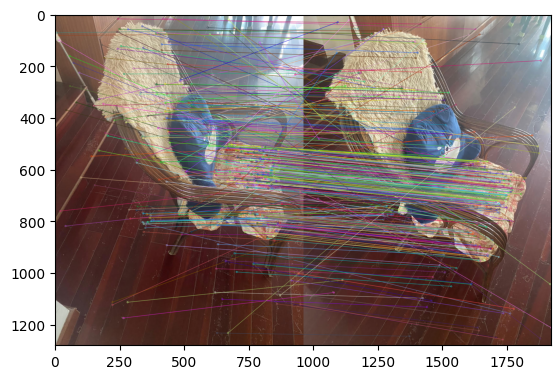

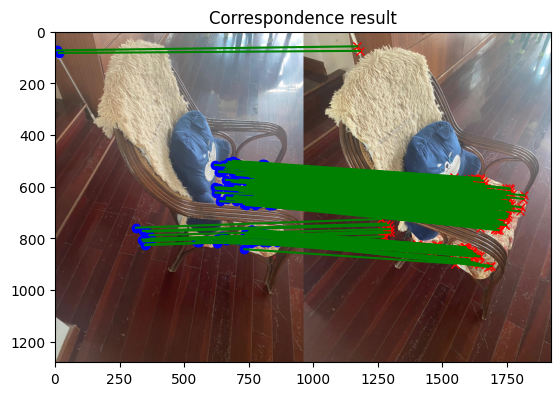

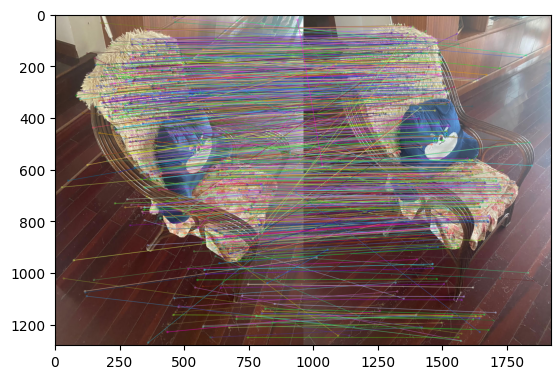

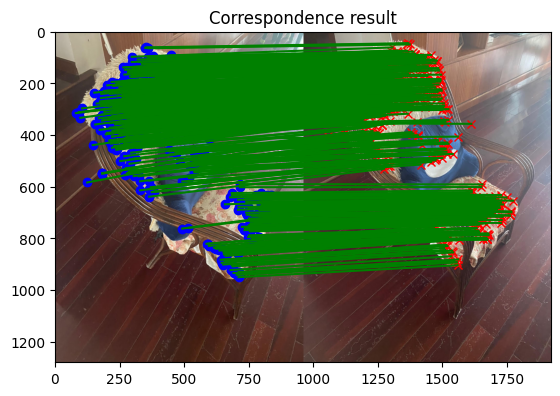

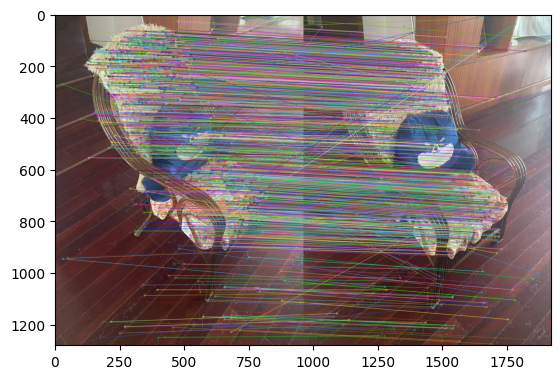

...

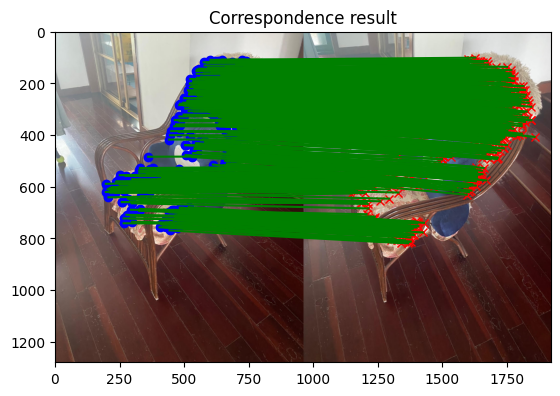

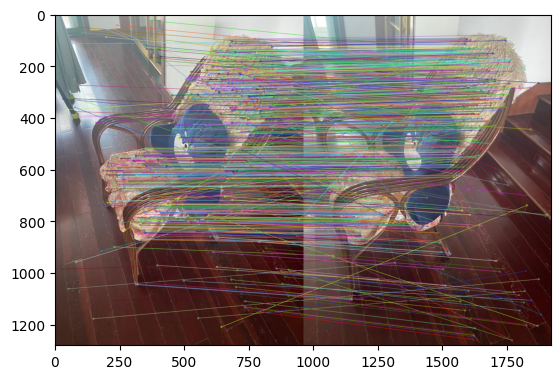

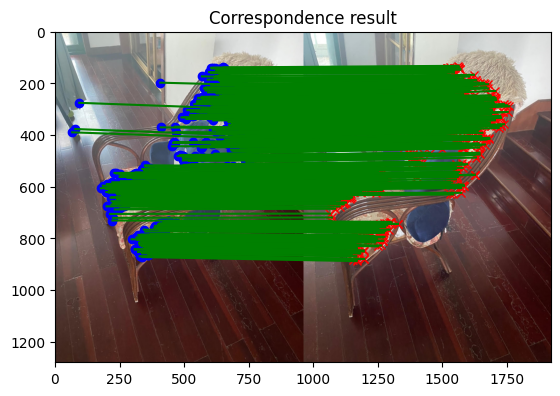

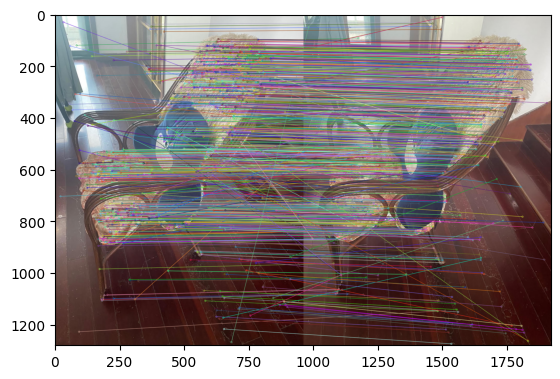

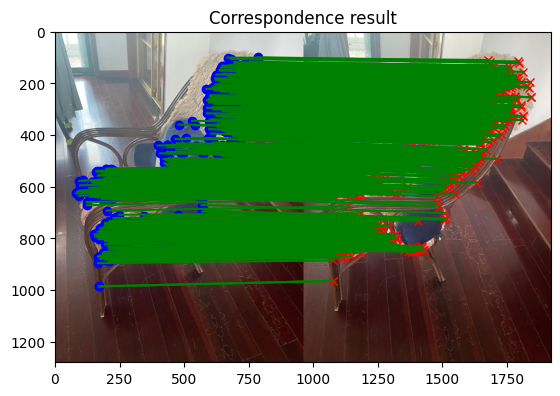

In [ ]:
kp_all, des_all, color_all = feature_color_extraction(ImageNames)
pairs = []

for i in range(0, len(ImageNames) - 1):
  Img1 = cv2.cvtColor(cv2.imread(ImageNames[i]), cv2.COLOR_BGR2RGB)
  Img2 = cv2.cvtColor(cv2.imread(ImageNames[i+1]), cv2.COLOR_BGR2RGB)
  pair = matching_and_testing(Img1, kp_all[i], des_all[i], Img2, kp_all[i+1], des_all[i+1])
  H, good_pair = ransac_homography(pair[:, :2], pair[:, 2:], pair)
  plot_corr(Img1, Img2, good_pair[:, :2], good_pair[:, 2:])
  pairs.append(good_pair)

## **Part III: Fundamental Matrix and Essential Matrix Computation**

First get the 3x3 camera intrinsic matrix (in this notebook, I am using instrinsic matrix for iphone 11). Since all the photos are taken by the same iphone 11 with default primary camera, the K matrix is approximated to be the same for all the images.

To compute the focal length in pixels, I am using the following formula:

F_x(pixels) = F(mm) * ImageWidth(pixels) / SensorWidth(mm)

F_y(pixels) = F(mm) * ImageHeight(pixels) / SensorWidth(mm)

The principal point is approximated at the center of the image. 

c_x = ImageWidth(pixels) / 2

c_y = ImageHeight(pixels) / 2

In [ ]:
Img1 = cv2.cvtColor(cv2.imread(ImageNames[0]), cv2.COLOR_BGR2RGB)
# Assuming that all the photos have the same image size
width = Img1.shape[1]
height = Img1.shape[0]
f_x = 25 * width / 5.76
f_y = 25 * height / 4.29
c_x = width / 2
c_y = height / 2
s = 0 # Skew coefficient is zero when the image axes are perpendicular.
K = np.array([[f_x, 0, c_x], [0, f_y, c_y], [0, 0, 1]])

In [ ]:
def compute_fundamental(p1, p2):	
  """
  Compute fundamental matrix given 8 pairs of corresponding points

  Input:
  p1, p2: (8,2) shape of 8 corresponding points

  Output:
  F: (3,3) shape of fundamental matrix
  """
  A = np.ones((0,9))

  for i in range(0,8):
    line1 = np.array([[p1[i,0] * p2[i,0], 
              p1[i,0] * p2[i,1],
              p1[i,0],p1[i,1] * p2[i,0],
              p1[i,1] * p2[i,1],
              p1[i,1],
              p2[i,0], 
              p2[i,1], 
              1]])
    A = np.append(A, line1, axis=0)

  # Use SVD to find the solution vector f such that Af = 0
  u,s,vh = np.linalg.svd(A)
  v = vh.T
  f = v[:,-1]
  F = f.reshape(3,3)
  u,s,vh = np.linalg.svd(F)
  s[2] = 0
  F = np.dot(u,np.dot(np.diag(s),vh))

  return F/F[2,2]

In [ ]:
# Ransac Rejection of Fundamental Matrix
def ransac_fundamental(p1, p2, pairs):
  
  # Input:
  # p1, p2: (N, 2) shape of correponding points

  # Output:
  # H: (3, 3) shape of estimated homography matrix such that lambda * p1 = H @ p2
  # inliers: inliners of the estimation

  # Normalization of coordinates
  z = np.ones((p1.shape[0], 1))
  p1 = np.append(p1, z, axis=1)
  p2 = np.append(p2, z, axis=1)

  mean1 = np.mean(p1[:2], axis=1)
  s1 = np.sqrt(2) / np.std(p1[:2])
  t1 = np.array([[s1, 0, -s1 * mean1[0]],[0, s1, -s1 * mean1[1]],[0, 0, 1]])
  p1 = np.dot(t1, p1.T).T
  mean2 = np.mean(p2[:2], axis=1)
  s2 = np.sqrt(2) / np.std(p2[:2])
  t2 = np.array([[s2, 0, -s2 * mean2[0]],[0, s2, -s2 * mean2[1]],[0, 0, 1]])
  p2 = np.dot(t2, p2.T).T

  # probability of RANSAC success
  p = 0.999
  w = 0.5
  n = 8
  k = np.ceil(np.log(1 - p) / np.log(1 - w**n)).astype(np.uint32)
  # Decide how many loops to run and what the threshold is
  inliners_max = 0
  for i in range (0,k):
  # RANSAC loop, inside in the loop
  #     1) Randomly pick n samples from p1 and p2 that is enough to fit a model (n=8 here)
        u1_index = np.random.choice(p1.shape[0], n, replace=False)
        u1 = np.empty((0,2))
        for j in u1_index:
          u1 = np.append(u1, np.array([[p1[j,0],p1[j,1]]]), axis=0)
        v1 = np.empty((0,2))
        for j in u1_index:
          v1 = np.append(v1, np.array([[p2[j,0],p2[j,1]]]), axis=0)

  #     2) Fit the model and get a estimation
        F = compute_fundamental(u1, v1)
        standard = np.zeros(p1.shape[0])
        result = []
        
        for j in range(0,len(p1)):
           result = np.append(result, np.array([np.dot(p2[j, :].T, np.dot(F, p1[j, :]))]), axis=0)
        distances = result - standard

  #     3) Count consensus(# of inliners that is close to the estimatiion within the threshold)
        eps = 10**-3
        indexes = np.where(distances < eps)
        inliers_match = pairs[indexes]
        inliners = sum(distances < eps)

        inliers_tmp = np.where(distances < eps)
        if inliners > inliners_max:
          best_F = F
          inliners_max = inliners
          inliers_good = inliers_match
  
  # reverse normalization
  best_F = np.dot(t2.T, np.dot(best_F, t1))

  return best_F, inliers_good

In [ ]:
new_pairs = []

F_matrices = []
for i in range (0, len(ImageNames) - 1):
  each_pair = pairs[i]
  F, new_pair = ransac_fundamental(each_pair[:, :2], each_pair[:, 2:], each_pair)
  F_matrices.append(F)
  new_pairs.append(new_pair)

E_matrices = []
for i in range (0, len(ImageNames) - 1):
  E_matrix = K.T @ F_matrices[i] @ K
  E_matrices.append(E_matrix)


In [ ]:
# Alternative Generation of essential matrix with openCV.
E_matrices = []
for i in range(0, len(ImageNames) - 1):
  focal_length = 0.5 * (K[0, 0] + K[1, 1])
  principle_point = (K[0, 2], K[1, 2])
  each_pair = pairs[i]
  E, mask = cv2.findEssentialMat(each_pair[:,:2], each_pair[:,2:], focal_length, principle_point, cv2.RANSAC, 0.999, 1.0)
  E_matrices.append(E)

## **Part IV: Camera Pose Extraction and Triangulation**

In [ ]:
# Construct the projection matrices from the computed essential matrices and the given instrinsic matrices using recoverPose() from OpenCV.
Projection_matrices = []
for i in range(0, len(ImageNames) - 1):
  new_pair = pairs[i]
  points, R_est, t_est, mask_pose = cv2.recoverPose(E_matrices[i], new_pair[:, :2], new_pair[:, 2:])
  proj = np.zeros((3, 4))
  proj[0:3, 0:3] = R_est
  proj[:, 3] = t_est.T
  proj = np.dot(K, proj)
  Projection_matrices.append(proj)

In [ ]:
structure = []
colors = []
for i in range(0, len(ImageNames) - 2): 
  pair1 = pairs[i]
  p1 = pair1[:, :2]
  p2 = pair1[:, 2:]
  s = cv2.triangulatePoints(Projection_matrices[i], Projection_matrices[i+1], p1.T, p2.T)

  Img1 = cv2.cvtColor(cv2.imread(ImageNames[i]), cv2.COLOR_BGR2RGB)
  Img2 = cv2.cvtColor(cv2.imread(ImageNames[i+1]), cv2.COLOR_BGR2RGB)

  for i in range(len(s[0])):
      if 0 < round(p1[i,0]) and round(p1[i,0]) < height and 0 < round(p1[i,1]) and round(p1[i,1]) < width:
        colors.append([Img2[round(p1[i,0]), round(p1[i,1]), 0], Img2[round(p1[i,0]), round(p1[i,1]), 1], Img2[round(p1[i,0]), round(p1[i,1]), 2]])
      else:
        colors.append([0, 0, 0])
      col = s[:, i]
      col /= col[3]
      structure.append([col[0], col[1], col[2]])

In [ ]:
# Plot the colored version of the scattered points.
import plotly.graph_objs as go

structure = np.array(structure)
print(structure.shape)
colors = np.array(colors)

df = pd.DataFrame({'X': structure[:,0],'Y': structure[:,1],'Z': structure[:,2],'R': colors[:,0],'G': colors[:,1],'B': colors[:,2]})

trace = go.Scatter3d(x=df.X,y=df.Y,z=df.Z,mode='markers',marker=dict(size=5,color=['rgb({},{},{})'.format(r,g,b) for r,g,b in zip(df.R.values, df.G.values, df.B.values)], opacity=0.9,))

data = [trace]

layout = go.Layout(margin=dict(l=0,r=0,b=0,t=0))

fig = go.Figure(data=data, layout=layout)
fig.show()

(15067, 3)


## **Part V: Creating Mesh**

In [ ]:
def write_pointcloud(filename,xyz_points,rgb_points=None):

    """ creates a .ply file of the point clouds generated
    """

    # Write header of .ply file
    fid = open(filename,'wb')
    fid.write(bytes('ply\n', 'utf-8'))
    fid.write(bytes('format binary_little_endian 1.0\n', 'utf-8'))
    fid.write(bytes('element vertex %d\n'%xyz_points.shape[0], 'utf-8'))
    fid.write(bytes('property float x\n', 'utf-8'))
    fid.write(bytes('property float y\n', 'utf-8'))
    fid.write(bytes('property float z\n', 'utf-8'))
    fid.write(bytes('property uchar red\n', 'utf-8'))
    fid.write(bytes('property uchar green\n', 'utf-8'))
    fid.write(bytes('property uchar blue\n', 'utf-8'))
    fid.write(bytes('end_header\n', 'utf-8'))

    # Write 3D points to .ply file
    for i in range(xyz_points.shape[0]):
        fid.write(bytearray(struct.pack(bytes("fffsss", "utf-8"),xyz_points[i,0],xyz_points[i,1],xyz_points[i,2],
                  bytes(str(rgb_points[i,0]),"utf-8"), bytes(str(rgb_points[i,1]),"utf-8"), bytes(str(rgb_points[i,2]),"utf-8"))))
    fid.close()

In [ ]:
# load your directory
cd /content/drive/MyDrive/3DreconstructionAR

In [ ]:
!pip install open3d
import open3d as o3d

In [ ]:
# customizable directory and file name
filename = 'chair-pointCloud.ply'
output_filename = os.path.join('/content/drive/MyDrive/3DreconstructionAR', filename)
write_pointcloud(output_filename, structure, colors)

In [ ]:
pcd = o3d.io.read_point_cloud("chair-pointCloud.ply")
pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1,max_nn=30))
poisson_mesh = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd, depth=8, width=0, scale=1.1, linear_fit=False)[0]
bbox = pcd.get_axis_aligned_bounding_box()
p_mesh_crop = poisson_mesh.crop(bbox)
o3d.io.write_triangle_mesh("/content/drive/MyDrive/3DreconstructionAR"+"p_mesh_c.ply", p_mesh_crop)

In [ ]:
#function creation
def lod_mesh_export(mesh, lods, extension, path):
    mesh_lods={}
    for i in lods:
        mesh_lod = mesh.simplify_quadric_decimation(i)
        o3d.io.write_triangle_mesh(path+"lod_"+str(i)+extension, mesh_lod)
        mesh_lods[i]=mesh_lod
    print("generation of "+str(i)+" LoD successful")
    return mesh_lods

In [ ]:
my_lods = lod_mesh_export(poisson_mesh, [8000,500,300], ".ply", "custom")